# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med

<ipython-input-1-884896f37a0d>:9: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import convolve
<ipython-input-1-884896f37a0d>:10: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-1-884896f37a0d>:11: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values.

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions.
3. Compute the magnitude of the gradient.
4. Normalize the gradient values.

In [3]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

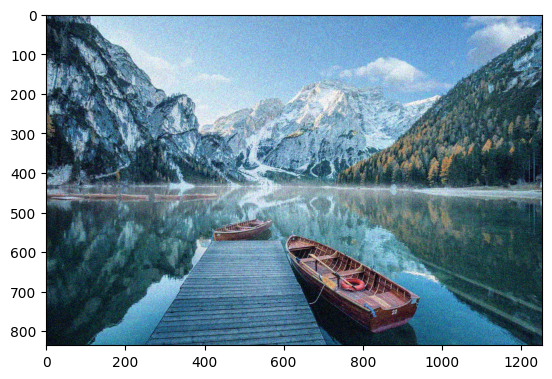

In [4]:
original_image = np.load('/content/drive/MyDrive/VisionComp_Imagenes/data/img.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

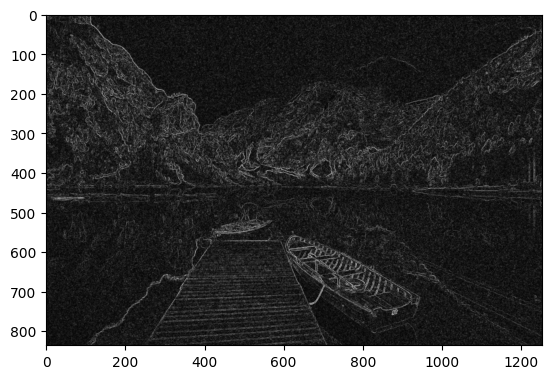

In [5]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

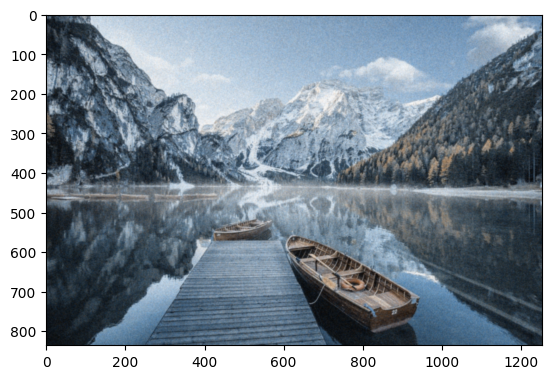

In [6]:
img_gauss = gauss(img, sigma=1)
plt.imshow(img_gauss)

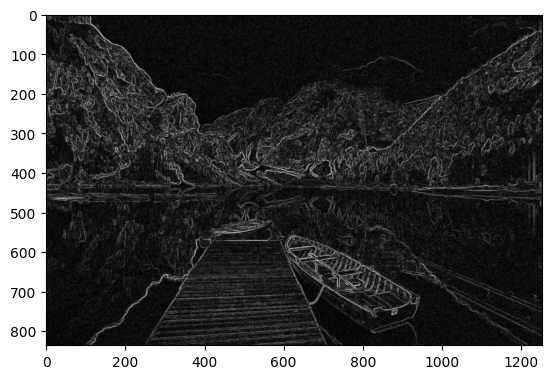

In [7]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

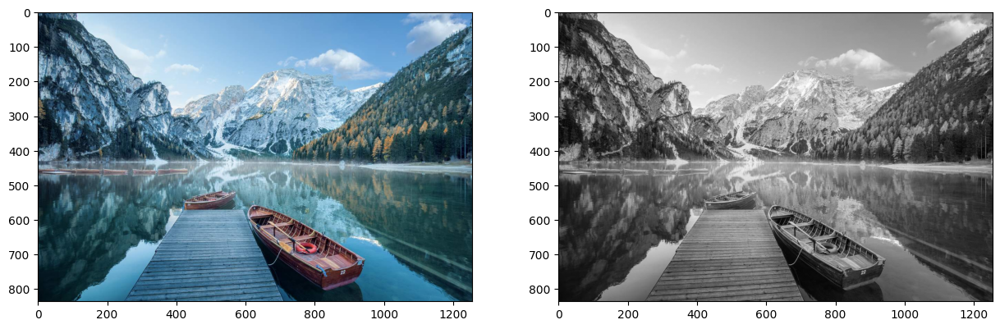

In [8]:
img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/lago_1.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [9]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [10]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [11]:
kernel_size = 3

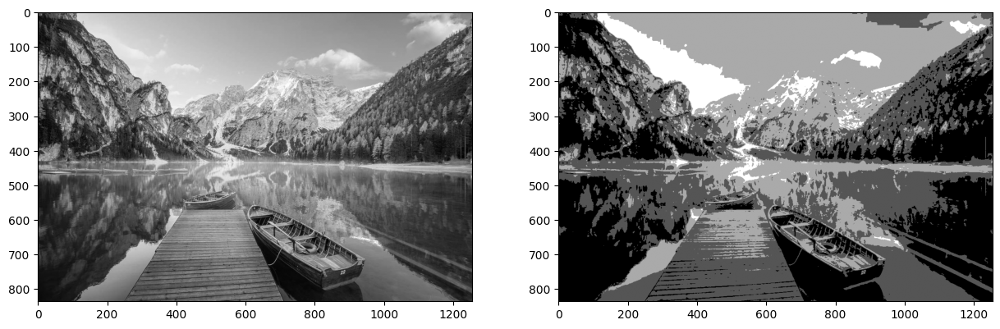

In [12]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity.

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions:
- horizontal $(x)$
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [13]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

<ipython-input-13-dddc2aedcd55>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-13-dddc2aedcd55>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


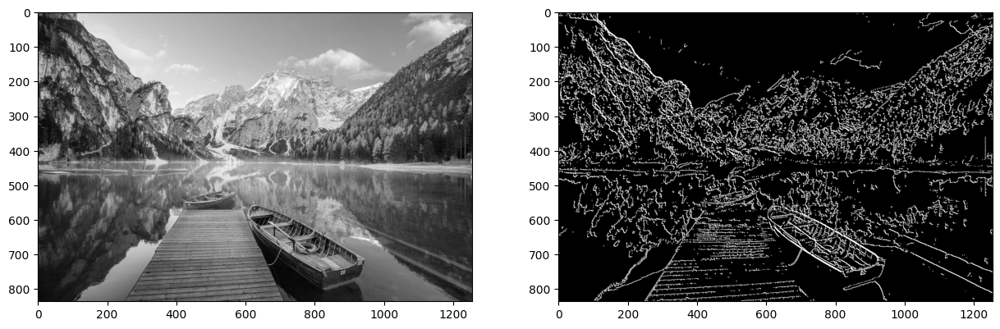

In [14]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [15]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

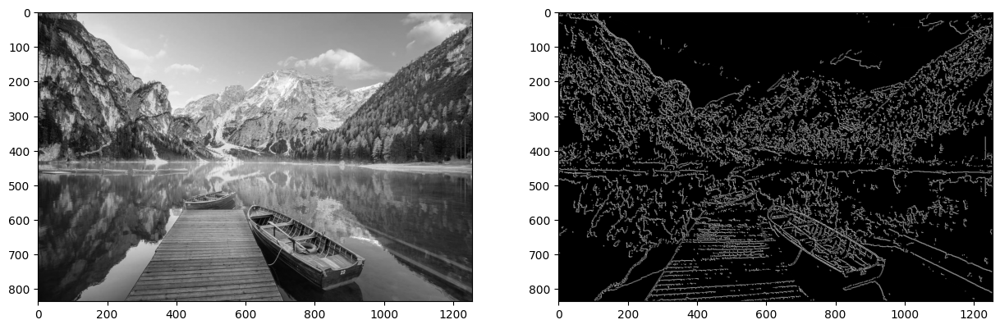

In [16]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [17]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(25)
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

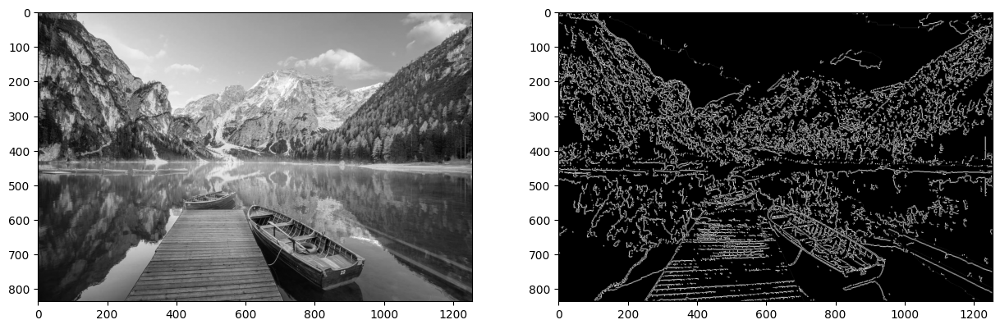

In [18]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [19]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

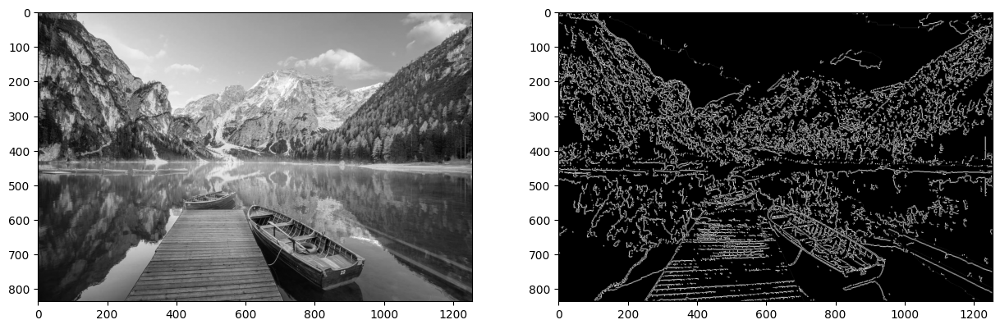

In [20]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

In [21]:
# TODO: Challenge

# a) modifica el valor de sigma y observa los cambios en las lineas detectas.

Para realizar este ejercicio realizaremos un proceso de iteracción entre diferentes valores de $\sigma$ y el tamaño del Kernel.

Ejecutamos en un array estos valores y observamos los cambios generados en la imagen a forma de matriz.

In [22]:
?convolve # Vemos los parámetros que usa la función 'convolve'

Object `convolve # Vemos los parámetros que usa la función 'convolve'` not found.


Para la realización de este trabajo utilizamos diferentes tipos de funciones. Entre ellos la función `convolve` de la libreria scipy.

## Convolve
La función `scipy.ndimage.filters.convolve` de la biblioteca `SciPy` en Python se utiliza para realizar la convolución multidimensional de una matriz con un filtro o kernel dado. Esta función es especialmente útil en el procesamiento de imágenes y otras áreas donde se trabaja con datos multidimensionales.

-  permite realizar convoluciones en matrices de cualquier dimensión. Toma una matriz de entrada y un kernel como entrada, y devuelve una nueva matriz que representa la convolución de la entrada con el kernel.



In [23]:
# Rango de parametros para sigma y el kernel para observar lso cambios a diferentes parámetros
sigma_values = [1, 3, 5, 7, 10 ,15, 20]
kernel_sizes = [1, 3, 5, 7, 10]

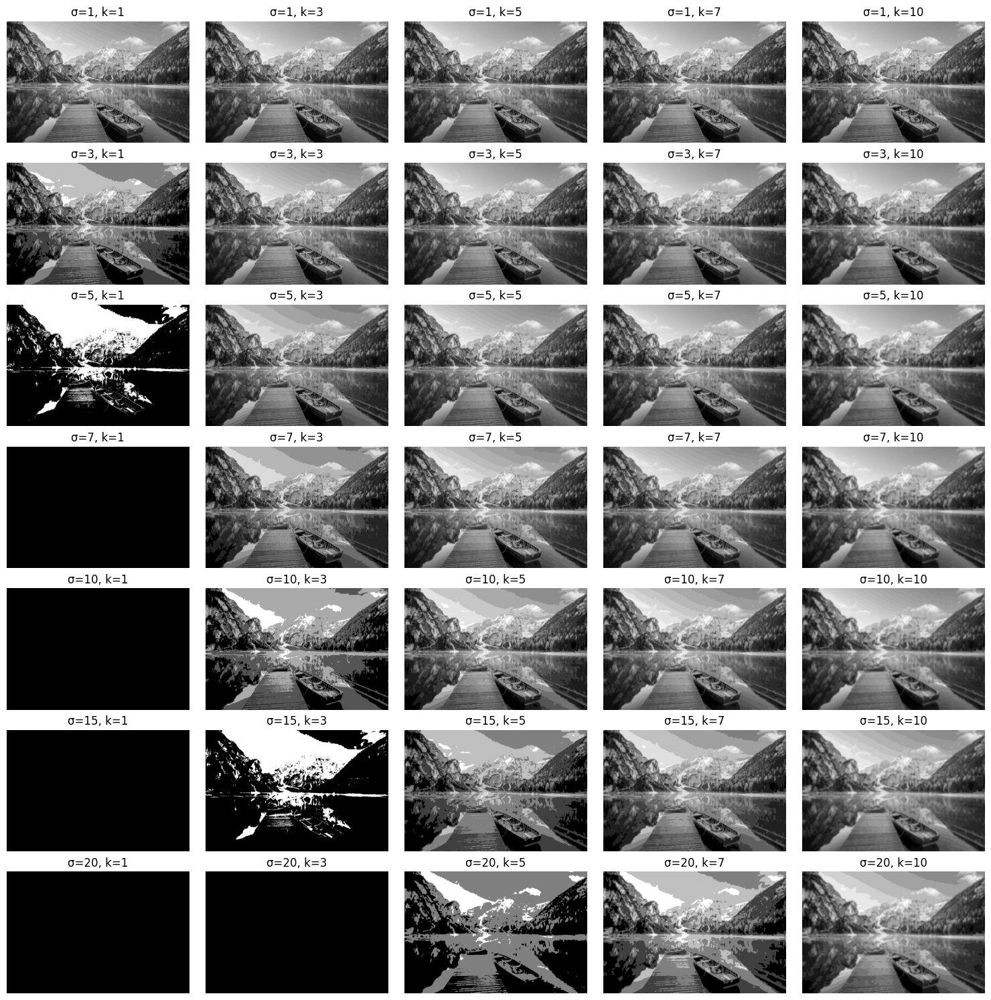

In [24]:
plt.figure(figsize=(15, 15))
# Iterar sobre cada combinación de sigma y kernel_size
for i, sigma in enumerate(sigma_values):
    for j, k_size in enumerate(kernel_sizes):
        kernel = gaussian_kernel(k_size, sigma)
        img_gaussian = convolve(img_gray, kernel)

        plt.subplot(len(sigma_values), len(kernel_sizes), i * len(kernel_sizes) + j + 1)
        plt.imshow(img_gaussian, cmap="gray")
        plt.axis("off")
        plt.title(f"σ={sigma}, k={k_size}")

plt.tight_layout()
plt.show()


Conclución: En la siguiente matriz de imagenes podemos observar la diferencia entre las variaciones de los parametros de la sigma y el tamaño del kernel. Observamos que en general para un kernel pequeño y una sigma muy grande el resultado es una sobresaturación que vuelve completamente oscura nuestra imagen. El tamaño del kernel es de importancia porque a un kernel muy grande no importa tener una intensidad de sigma grande, la imagen se ve igual que la original en escala de grieses.

El uso del tamaño del Kernel y el tamaño de la saturación con sigma con parametros a cuidar según el resultado final que se busque. pues puede dar un rango desde oscurecer la imagen a pasar a una escla de blanco y negro a no relizar ninguna modificación a la imagen original.

# b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido.





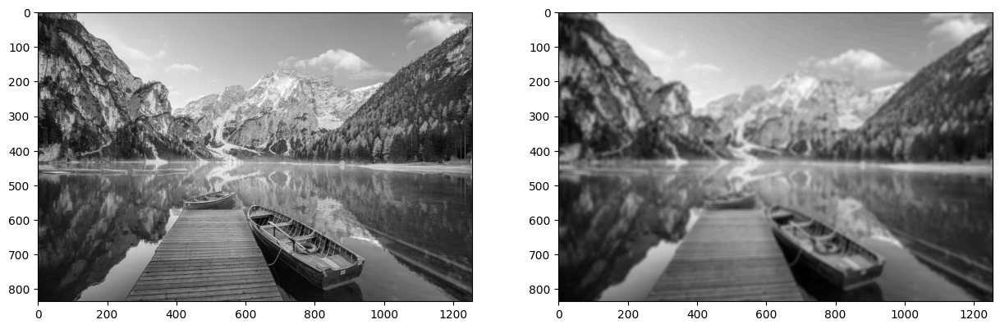

In [25]:
# Ejemplo con remoción de ruido
kernel_size = 10 # Usamos un kernel gande que nos ayudara a remover el ruido.
sigma = 9
# Procesamiento de la imagen.
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
# Despliegue de la imagen con ruidio removido y contraste con la imagen original.
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

Conclusión: Observemos que con la remodelación del ruido nos ayuda a que la imagen se vea más clara y conserve el contorno de sus lineas. Así como el color de la imagne original.

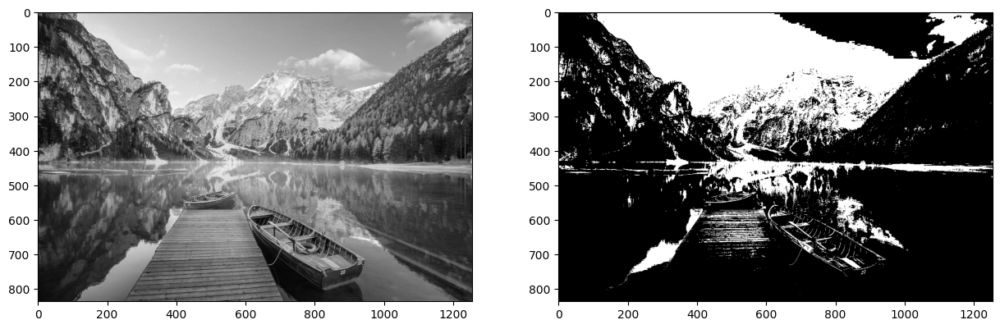

In [26]:
# Ejemplo sin remoción de ruido
kernel_size = 0 # Ponemos el parametro como cero, lo cual significa que no habra remoción de ruido.
sigma = 5
# procesamiento de la imagen.
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
# Despliegue de la imagen sin ruidio removido y contraste con la imagen original.
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

Conclusión: Al no remover el ruido podemos apreciar que el algoritmo elimina todo tono gris en la imagen y queda en una escala de blanco y negro.

# c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

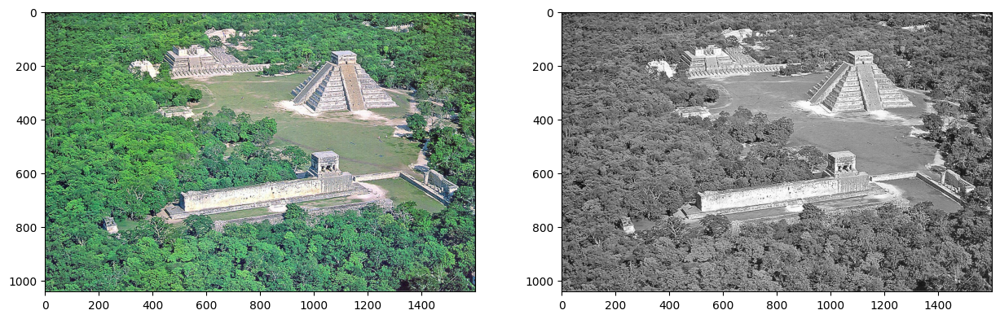

In [27]:
img = cv2.imread('/content/drive/MyDrive/VisionComp_Imagenes/data/chichen_itza.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

En esta imagen vemos una vista aerea del templo de kukulkán en Chichen-itza. Lo que buscamos es quedarnos con una imagen que resalte el relieve y las lineas de las estructuras arquitectonicas y elimine la presencia de la fauna que rodea el alrededor del sitio arqueologico.

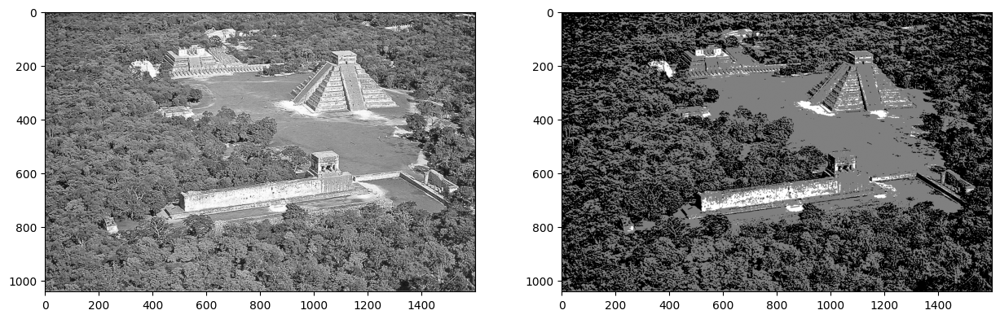

In [28]:
kernel_size = 3 # Elegimos un quernel relativamente pequeño
sigma = 13 # elegimos una alta saturación para nuestra imagen .
# aplicamos el filtro
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
# Contraste con la imagen original.
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

Auch!! El primer procesamiento que estamos realizando no es el correcto, hay que modificar el tamaño del kernel y la saturación de sigma pues no se denotan bien las estructuras del templo ni los edificios alrededor.

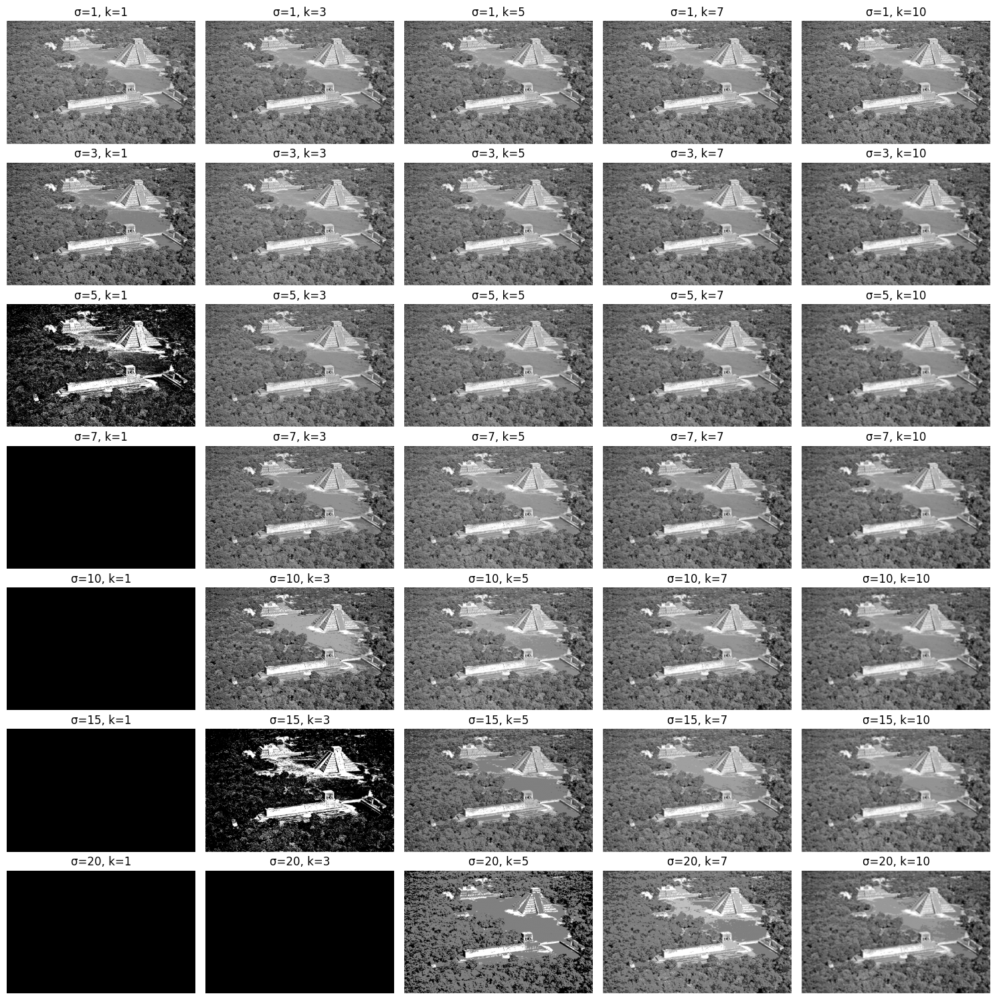

In [29]:
plt.figure(figsize=(15, 15))
# Iterar sobre cada combinación de sigma y kernel_size
for i, sigma in enumerate(sigma_values):
    for j, k_size in enumerate(kernel_sizes):
        kernel = gaussian_kernel(k_size, sigma)
        img_gaussian = convolve(img_gray, kernel)

        plt.subplot(len(sigma_values), len(kernel_sizes), i * len(kernel_sizes) + j + 1)
        plt.imshow(img_gaussian, cmap="gray")
        plt.axis("off")
        plt.title(f"σ={sigma}, k={k_size}")

plt.tight_layout()
plt.show()

Reciclamos el ejercicio anterior donde realizamos una matríz variando los parametos para encontrar la mejor combinación que regresa el resultado que buscamos.

Encontramos que la combinación que genera el resultado esperado es $sigma=16$ y $Kernel=3$

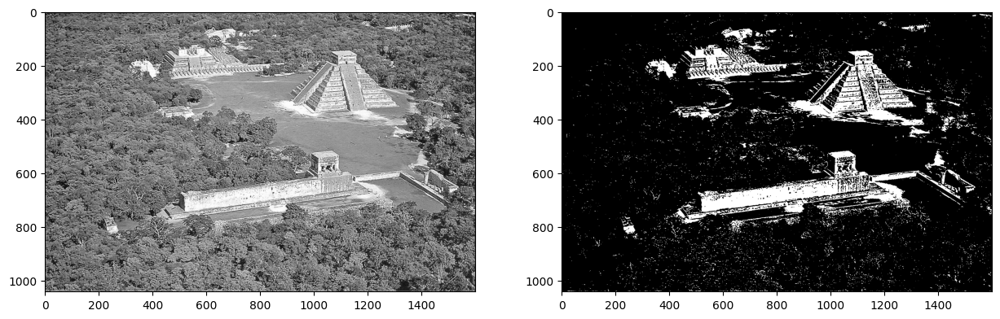

In [30]:
# Esta resolución fue la que mejor cumplio nuestras expectativas de resaltar los bordes y estructuras de la ciudad de Chichen itza.
kernel_size=3
sigma=16
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))
# Imprimimos la imagen original y el resultado esperado.
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

Conclusión: Observemos que hemos logrado reducir la presencia de la flore alrededor del complejo y en la imagen final logramos nuestro objetivo que es quedarnos con los relieves principales de la Ciudad y sus estructuras.

# Referencias:

- Jan Erik Solem, Programming Computer Vision with Python O'Reilly Media, 2012
- [Open CV. Canny Edge detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html)
- [Open CV. Canny Edge detection Tutorial](https://docs.opencv.org/3.4/da/d5c/tutorial_canny_detector.html)
- [OpenCV Edge Detection ( cv2.Canny )](https://pyimagesearch.com/2021/05/12/opencv-edge-detection-cv2-canny/)